<a href="https://colab.research.google.com/github/alamwasim/microstructure-alignment/blob/feature-matching/microstructure_alignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [21]:
import pandas as pd
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import imutils

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [4]:
PATH_OF_DATA= """/content/gdrive/'My Drive'/'ML microstructure alignment'/"""
!ls {PATH_OF_DATA}

26.jpg	27.jpg


In [5]:
!cp '/content/gdrive/My Drive/ML microstructure alignment/26.jpg' "26.jpg"
!cp '/content/gdrive/My Drive/ML microstructure alignment/27.jpg' "27.jpg"

In [6]:
img26 = cv2.imread('26.jpg',0)
img27 = cv2.imread('27.jpg',0)

In [7]:
img26.shape, img27.shape

((1536, 2048), (1536, 2048))

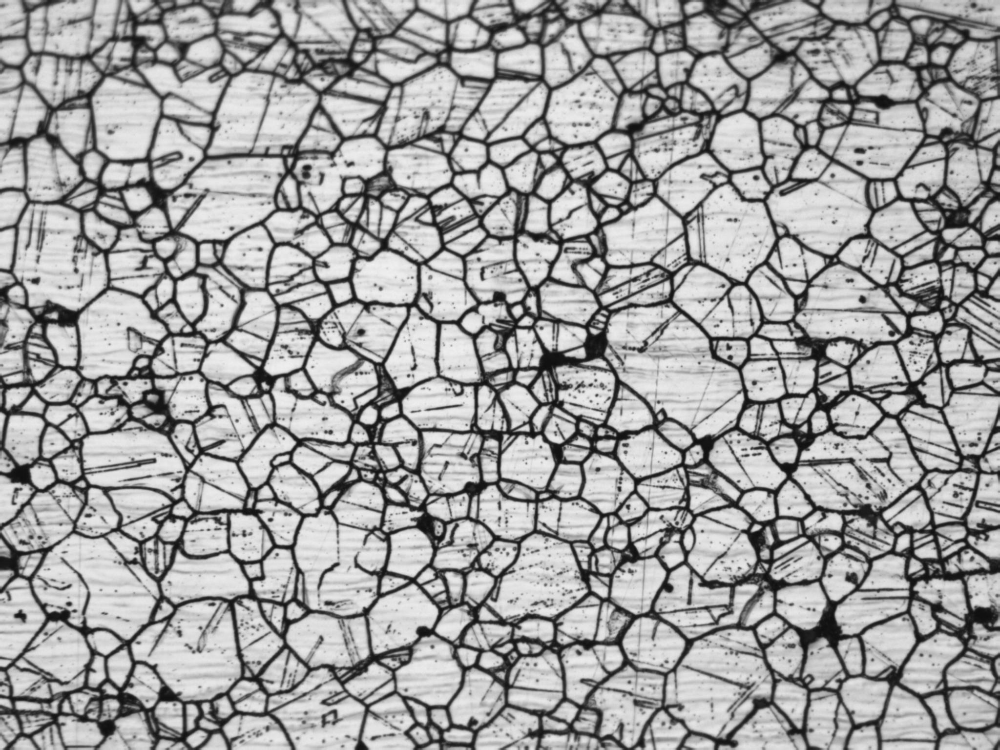

In [8]:
cv2_imshow(img26)

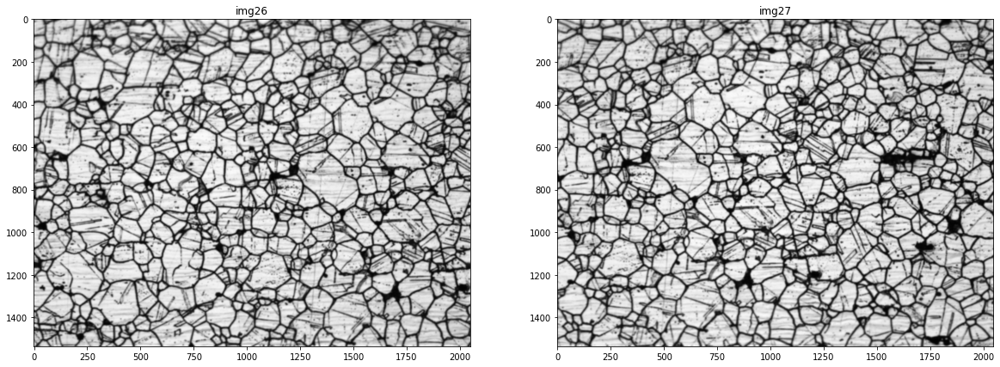

In [8]:
# Show the image with cv2_imshow
# cv2_imshow(img26)
#Show the image with matplotlib
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
fig, (ax1, ax2,) = plt.subplots(figsize=(20, 20), ncols=2)
ax1.imshow(img26, cmap = 'gray', interpolation = 'bicubic')
ax2.imshow(img27, cmap = 'gray', interpolation = 'bicubic')
ax1.title.set_text('img26')
ax2.title.set_text('img27')
plt.show()

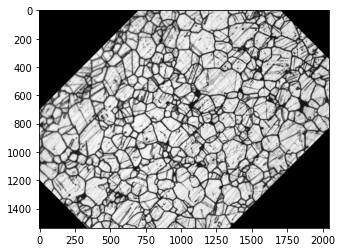

In [22]:
img = img26.copy()
rows,cols = img.shape

M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)
dst = cv2.warpAffine(img,M,(cols,rows))
plt.imshow(dst,cmap='gray')

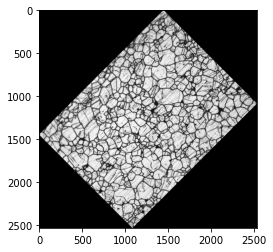

In [24]:
plt.imshow(imutils.rotate_bound(img26,-45),cmap='gray')

Text(0.5, 1.0, 'Detected Point')

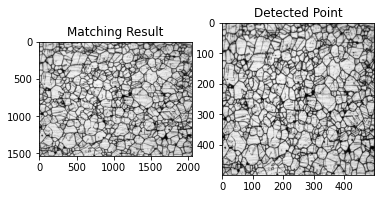

In [31]:
plt.subplot(121),plt.imshow(img26,cmap = 'gray')
plt.title('Matching Result')
plt.subplot(122),plt.imshow(cv2.resize(img26,(500,500)),cmap = 'gray')
plt.title('Detected Point')

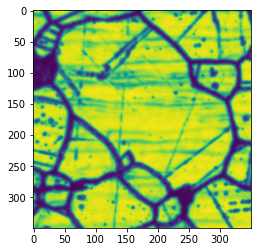

In [ ]:
ax,ay=400,550
a=img27[ay:ay+350,ax:ax+350]
plt.imshow(a)

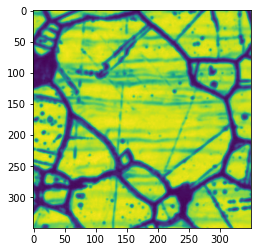

In [ ]:
bx,by=1205,613
b=img26[by:by+350,bx:bx+350]
plt.imshow(b)

cv2.TM_CCOEFF
(1203, 611) (1553, 961)


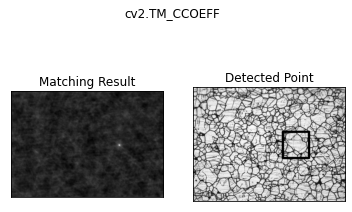

cv2.TM_CCOEFF_NORMED
(1203, 611) (1553, 961)


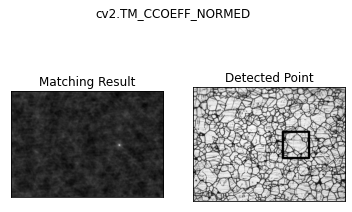

cv2.TM_CCORR
(1203, 611) (1553, 961)


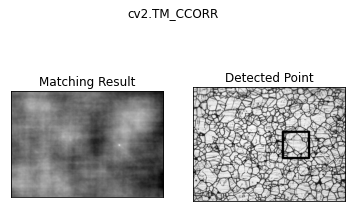

cv2.TM_CCORR_NORMED
(1203, 611) (1553, 961)


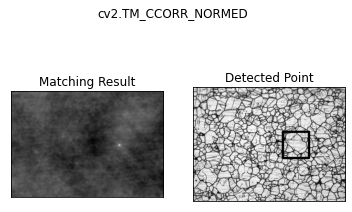

cv2.TM_SQDIFF
(1203, 611) (1553, 961)


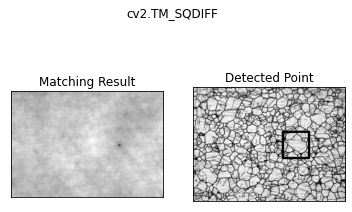

cv2.TM_SQDIFF_NORMED
(1203, 611) (1553, 961)


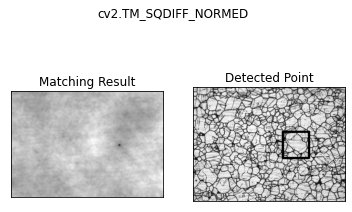

In [ ]:
img = img26.copy()
img2 = img.copy()
template = a
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    print(meth)
    img = img2.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    print(top_left,bottom_right)

    cv2.rectangle( img,top_left, bottom_right, 0, 30)

    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)

    plt.show()

In [ ]:
print("selective cropped coordinate in img27",(ax,ay),".Selective cropped Matched coordinate in  img26",top_left )
dx,dy=top_left[0]-ax,top_left[1]-ay
print("img26-img27 distance","dx:",dx,"dy:",dy)

selective cropped coordinate in img27 (400, 550) .Selective cropped Matched coordinate in  img26 (1203, 611)
img26-img27 distance dx: 803 dy: 61


In [33]:
def template_matching(img, template,method):
  h, w = template.shape[::-1]
  meth = eval(method)
  img=img.copy()

  # Apply template Matching
  res = cv2.matchTemplate(img,template,meth)
  min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
  
  # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
  if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
  else:
    top_left = max_loc
  bottom_right = (top_left[0] + h, top_left[1] + w)
  print("top_left and bottom_right",top_left,bottom_right)
  print("min_val and max_val",min_val,max_val)
  
  cv2.rectangle( img,top_left, bottom_right, 0, 30)
  
  plt.subplot(141),plt.imshow(template,cmap = 'gray')
  plt.title('Template'), plt.xticks([]), plt.yticks([])
  plt.subplot(142),plt.imshow(img,cmap = 'gray')
  plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
  plt.subplot(143),plt.imshow(img[top_left[1]:top_left[1]+w,top_left[0]:top_left[0]+h],cmap = 'gray')
  plt.title('Detected Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(144),plt.imshow(res,cmap = 'gray')
  plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
  plt.show()
  return top_left,min_val,max_val

******************** Kernel Centre Point (50, 50) Kernel top left corner  [0, 0] ********************


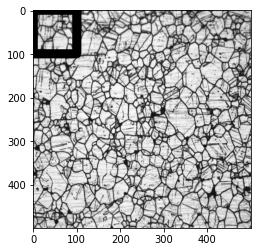

top_left and bottom_right (1592, 486) (1692, 586)
min_val and max_val -0.2864948511123657 0.33128249645233154


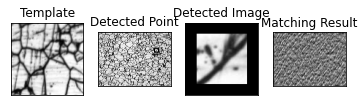

******************** Kernel Centre Point (50, 150) Kernel top left corner  [0, 100] ********************


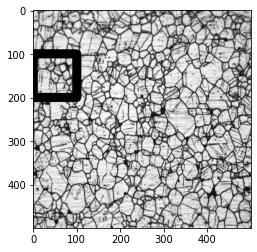

top_left and bottom_right (521, 869) (621, 969)
min_val and max_val -0.2675795257091522 0.26102158427238464


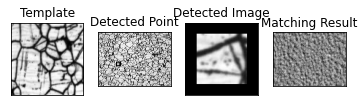

******************** Kernel Centre Point (50, 250) Kernel top left corner  [0, 200] ********************


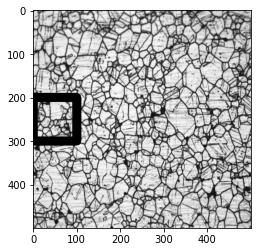

top_left and bottom_right (1745, 639) (1845, 739)
min_val and max_val -0.26639875769615173 0.2805311679840088


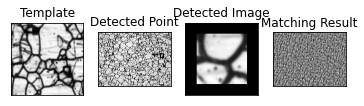

******************** Kernel Centre Point (50, 350) Kernel top left corner  [0, 300] ********************


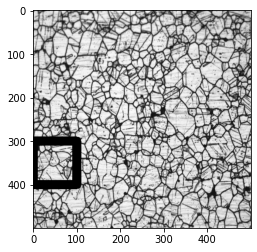

top_left and bottom_right (1742, 941) (1842, 1041)
min_val and max_val -0.27397090196609497 0.2569197118282318


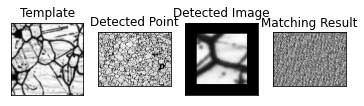

******************** Kernel Centre Point (50, 450) Kernel top left corner  [0, 400] ********************


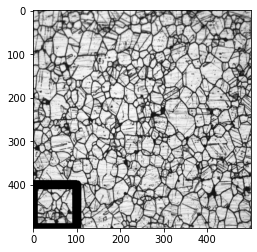

top_left and bottom_right (1674, 999) (1774, 1098)
min_val and max_val -0.27733537554740906 0.31221097707748413


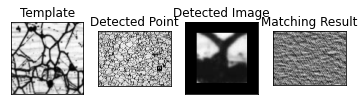

******************** Kernel Centre Point (150, 50) Kernel top left corner  [100, 0] ********************


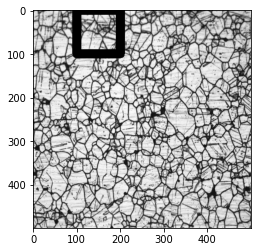

top_left and bottom_right (1854, 148) (1954, 248)
min_val and max_val -0.3417190909385681 0.333224892616272


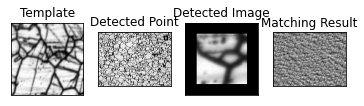

******************** Kernel Centre Point (150, 150) Kernel top left corner  [100, 100] ********************


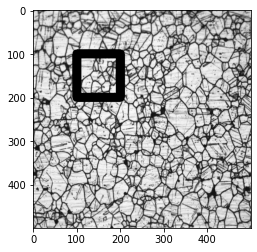

top_left and bottom_right (1003, 1069) (1103, 1169)
min_val and max_val -0.2501945495605469 0.2925567030906677


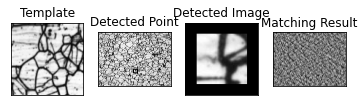

******************** Kernel Centre Point (150, 250) Kernel top left corner  [100, 200] ********************


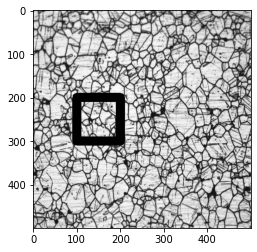

top_left and bottom_right (335, 462) (435, 562)
min_val and max_val -0.2105609029531479 0.2260504812002182


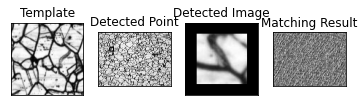

******************** Kernel Centre Point (150, 350) Kernel top left corner  [100, 300] ********************


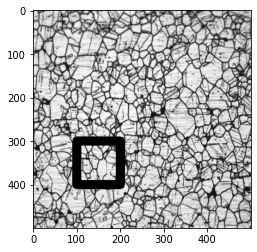

top_left and bottom_right (1304, 409) (1404, 509)
min_val and max_val -0.2295684665441513 0.26894065737724304


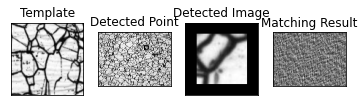

******************** Kernel Centre Point (150, 450) Kernel top left corner  [100, 400] ********************


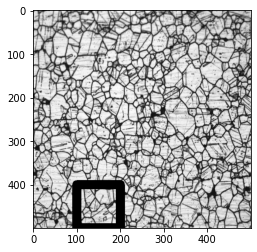

top_left and bottom_right (215, 1049) (315, 1148)
min_val and max_val -0.24175190925598145 0.2556946277618408


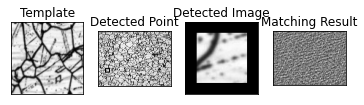

******************** Kernel Centre Point (250, 50) Kernel top left corner  [200, 0] ********************


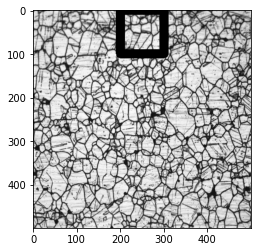

top_left and bottom_right (1019, 529) (1119, 629)
min_val and max_val -0.3034142553806305 0.31025004386901855


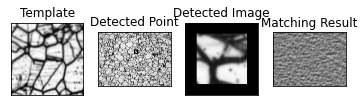

******************** Kernel Centre Point (250, 150) Kernel top left corner  [200, 100] ********************


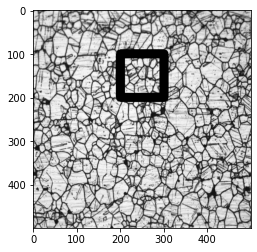

top_left and bottom_right (1047, 313) (1147, 413)
min_val and max_val -0.2035449743270874 0.2242966890335083


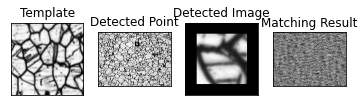

******************** Kernel Centre Point (250, 250) Kernel top left corner  [200, 200] ********************


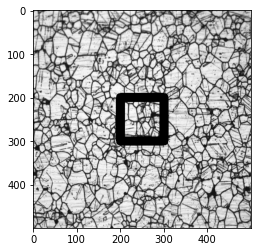

top_left and bottom_right (745, 1397) (845, 1497)
min_val and max_val -0.24648623168468475 0.29094645380973816


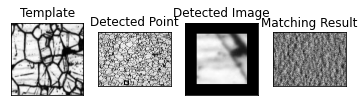

******************** Kernel Centre Point (250, 350) Kernel top left corner  [200, 300] ********************


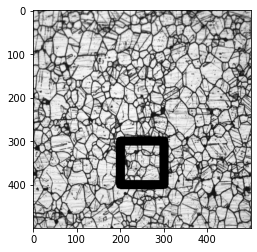

top_left and bottom_right (43, 791) (143, 891)
min_val and max_val -0.2034895122051239 0.261658251285553


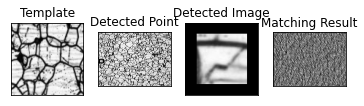

******************** Kernel Centre Point (250, 450) Kernel top left corner  [200, 400] ********************


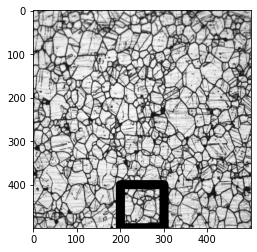

top_left and bottom_right (1584, 93) (1684, 192)
min_val and max_val -0.28516000509262085 0.2738233208656311


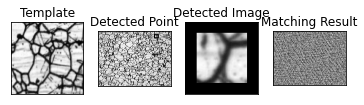

******************** Kernel Centre Point (350, 50) Kernel top left corner  [300, 0] ********************


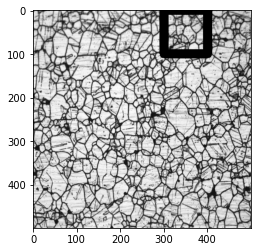

top_left and bottom_right (1737, 319) (1837, 419)
min_val and max_val -0.27143704891204834 0.29821309447288513


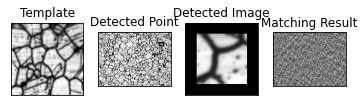

******************** Kernel Centre Point (350, 150) Kernel top left corner  [300, 100] ********************


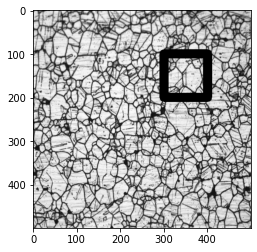

top_left and bottom_right (1363, 14) (1463, 114)
min_val and max_val -0.25655052065849304 0.23815986514091492


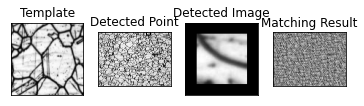

******************** Kernel Centre Point (350, 250) Kernel top left corner  [300, 200] ********************


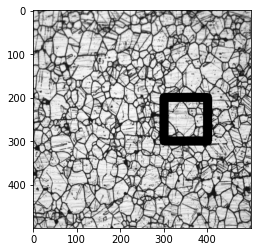

top_left and bottom_right (162, 254) (262, 354)
min_val and max_val -0.23901374638080597 0.2893204689025879


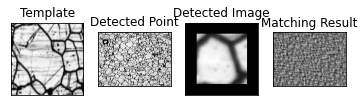

******************** Kernel Centre Point (350, 350) Kernel top left corner  [300, 300] ********************


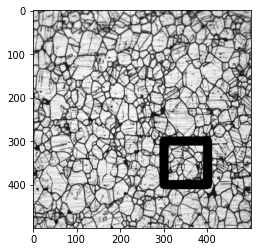

top_left and bottom_right (222, 205) (322, 305)
min_val and max_val -0.22346888482570648 0.26029834151268005


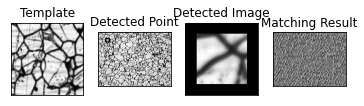

******************** Kernel Centre Point (350, 450) Kernel top left corner  [300, 400] ********************


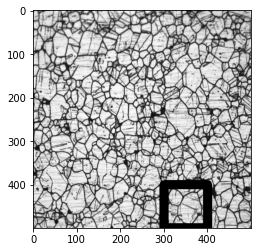

top_left and bottom_right (917, 733) (1017, 832)
min_val and max_val -0.22855395078659058 0.24563495814800262


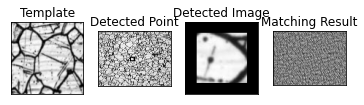

******************** Kernel Centre Point (450, 50) Kernel top left corner  [400, 0] ********************


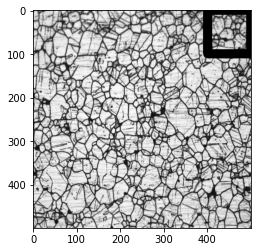

top_left and bottom_right (1407, 4) (1506, 104)
min_val and max_val -0.26064378023147583 0.2569688856601715


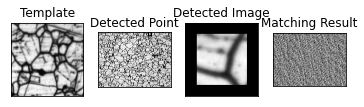

******************** Kernel Centre Point (450, 150) Kernel top left corner  [400, 100] ********************


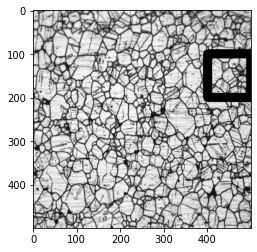

top_left and bottom_right (1627, 1021) (1726, 1121)
min_val and max_val -0.32258176803588867 0.3417626619338989


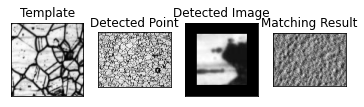

******************** Kernel Centre Point (450, 250) Kernel top left corner  [400, 200] ********************


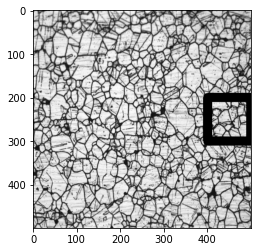

top_left and bottom_right (1060, 1180) (1159, 1280)
min_val and max_val -0.23843778669834137 0.23892386257648468


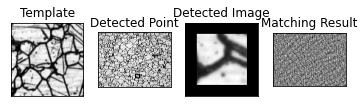

******************** Kernel Centre Point (450, 350) Kernel top left corner  [400, 300] ********************


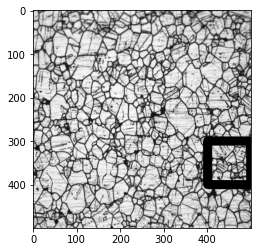

top_left and bottom_right (670, 774) (769, 874)
min_val and max_val -0.2225334346294403 0.2611682415008545


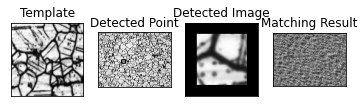

******************** Kernel Centre Point (450, 450) Kernel top left corner  [400, 400] ********************


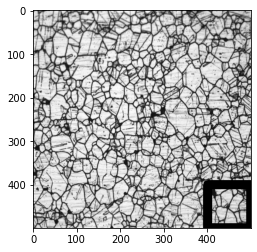

top_left and bottom_right (1004, 1352) (1103, 1451)
min_val and max_val -0.2603071928024292 0.33504021167755127


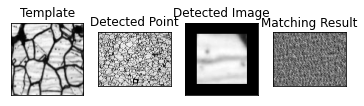



Max Value for lable got 0.3417626619338989 (450, 150, [400, 100])
dx []
dy []
Template have to be move by (nan, nan)


/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [39]:
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']
kernel=100
stride=100
threshold=0.99
template_img=cv2.resize(img26,(500,500))
img=img27.copy()
MAX=0
MAX_LABLE=0
dx=[]
dy=[]
for i in range(kernel//2,template_img.shape[1],stride):
  for j in range(kernel//2,template_img.shape[0],stride):
    img2=template_img.copy()
    top_left=[i-kernel//2,j-kernel//2]
    bottom_right=[top_left[0]+kernel,top_left[1]+kernel]
    if(bottom_right[0]>=template_img.shape[1]):
      bottom_right[0]=template_img.shape[1]-1
    if (bottom_right[1]>=template_img.shape[0]):
        bottom_right[1]=template_img.shape[0]-1
    print("*"*20,"Kernel Centre Point",(i,j),"Kernel top left corner ",top_left,"*"*20)
    cv2.rectangle( img2,tuple(top_left), tuple(bottom_right), 0, 20)
    plt.imshow(img2,cmap = 'gray')
    plt.show()
    template=template_img[top_left[1]:bottom_right[1],top_left[0]:bottom_right[0]]
    matched_top_left,min_val,max_val=template_matching(img,template,methods[1])
    if(max_val>threshold):
      dx.append(matched_top_left[0]-top_left[0])
      dy.append(matched_top_left[1]-top_left[1])

    if(max_val>MAX):
      MAX=max_val
      MAX_LABLE=(i,j,top_left)
print("\n\nMax Value for lable got",MAX,MAX_LABLE)
print("dx",dx)
print("dy",dy)
dx,dy=np.mean(dx),np.mean(dy)
print("Template have to be move by",(dx,dy))

       



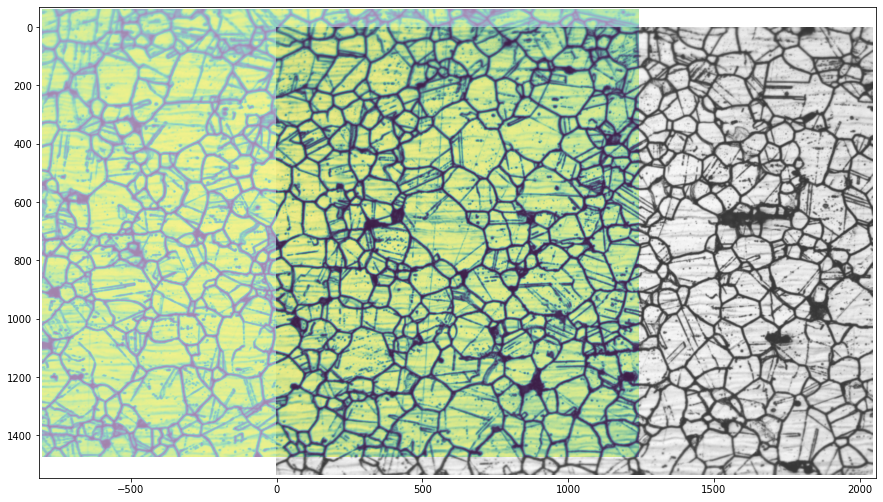

In [ ]:
fig = plt.gcf()
ax = fig.gca()
ax.imshow(img,cmap='gray',alpha=0.8)
nrows,ncols=template_img.shape
ax.imshow(template_img,alpha=0.5,extent=[dx,ncols+dx,nrows+dy,dy])
ax.set_xlim(dx-10,img.shape[1]+10)
ax.set_ylim(img.shape[0]+10,dy-10)
fig.set_size_inches(15,10)

In [ ]:
 fig.savefig("aligned.png")

In [ ]:
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()